# Data Visualization in Python

In this course we will work with real data and analyze it. To draw transparent conclusions, data visualization is key, therefore two of the most common plotting libraries in python are presented for you in this notebook. We will show how to approach creating different plot types using the two plotting libraries:
* matplotlib
* plotly
While we also presented the `holoviews` library in the tutorial video we recommend using `matplotlib` and `plotly` since `holoviews` is not that popular anymore.
For this unit we use covid data from the last year which is stored in a `pickle`-file (`unit_7_datafile.p`). 
What the `pickle` library is, what it really does and if one can eat it 🥒 is not really relevant right now, we will just leave it be with executing the cell. 

The data loaded from the pickle-file contains data of the hospital- and icu-patients for each day starting from January 1st 2020 to November 7th 2020 for three countries: Austria, Germany and Italy.

Using `matplotlib` and`plotly`, we will compare how the two libraries plot
* single line graphs
* multi line graphs
* subplots (multiple plots in one graph)

If you want to visualize other plot types (like histograms, scatter plots, bar plots, ...) visit the documentations of the plotting libraries in the respective section of the notebook.


## Matplotlib


Matplotlib is a Python library where the syntax is similar to the plotting environment in MATLAB. While it might be one of the more "traditional" plotting libraries in python, it is still widely used and you should have definitely heard about it in your programming career. Just think about it like an old trusty bike from your childhood that takes a lot of convincing when riding up a steep hill and is most likely passed by its younger bike-decendants but still will never let you down. 🚲

For the full documentation of `matplotlib`, visit
https://matplotlib.org/


Before we start working, we need to import matplotlib into our Python environment:

### Installation

Matplotlib is an external package which is not included in the python standard library so you have to install it using pip. For more information on packages and pip (the **P**ackage **I**nstaller for **P**ython) you might want to revisit Unit 06 where we took a closer look into that matter.

If you have a windows machine, use
```
pip install matplotlib
```


If your computer runs on macOS or Linux, type
```
pip3 install matplotlib
```

We then have to import the `matplotlib.pyplot` package into our project. It's common to use the `plt` abbrevation for that. (like `pd` for the `pandas` package or `np` for `numpy`)

In [3]:
import matplotlib.pyplot as plt # or from matplotlib import pyplot as plt

But what use has a plotting library without data? We will have to unpickle our pickle-object `unit_7_data.p`.

Now it's the perfect time to think about a meaningful, intuitive and heartwarming variablename so that the curious reader of our notebook can already guess what the value of the variable is just by reading its name 😇. Think... Think.. Yes, we will call it `data`!
`data` reveals itself to be just another ordinary dictionary. Sneaky!

In [4]:
# read data for plotting from unit_7_data.p file (available from TC)
import pickle 

with open("unit_7_data.p", "rb") as p:
    data = pickle.load(p)

We can also `print` our data to have a closer look at what we are going to visualize 😉

In [5]:
print(data)

{'Austria': defaultdict(<class 'list'>, {'date': array(['2019-12-31', '2020-01-01', '2020-01-02', '2020-01-03',
       '2020-01-04', '2020-01-05', '2020-01-06', '2020-01-07',
       '2020-01-08', '2020-01-09', '2020-01-10', '2020-01-11',
       '2020-01-12', '2020-01-13', '2020-01-14', '2020-01-15',
       '2020-01-16', '2020-01-17', '2020-01-18', '2020-01-19',
       '2020-01-20', '2020-01-21', '2020-01-22', '2020-01-23',
       '2020-01-24', '2020-01-25', '2020-01-26', '2020-01-27',
       '2020-01-28', '2020-01-29', '2020-01-30', '2020-01-31',
       '2020-02-01', '2020-02-02', '2020-02-03', '2020-02-04',
       '2020-02-05', '2020-02-06', '2020-02-07', '2020-02-08',
       '2020-02-09', '2020-02-10', '2020-02-11', '2020-02-12',
       '2020-02-13', '2020-02-14', '2020-02-15', '2020-02-16',
       '2020-02-17', '2020-02-18', '2020-02-19', '2020-02-20',
       '2020-02-21', '2020-02-22', '2020-02-23', '2020-02-24',
       '2020-02-25', '2020-02-26', '2020-02-27', '2020-02-28',
      

### Single and Multiple Line Graphs

Line graphs are helpful to show how a variable changes over time. They can be created by using `plt.plot(<x_values>, <y_values>)`.
Don't forget to create a new, empty figure object before with `plt.figure()`! 
We can pass the `figsize` argument to the `.plot` to define the size of our figure object beforehand. `figsize` is a tuple in the form of `(<width>, <height>)` where the values are given in inch.

We can label the x- and y- axes by using `plt.xlabel()` and `plt.ylabel()`. The plot title can be set by using `plt.title()`.

Let's plot the number of total hospital patients over time in Austria.

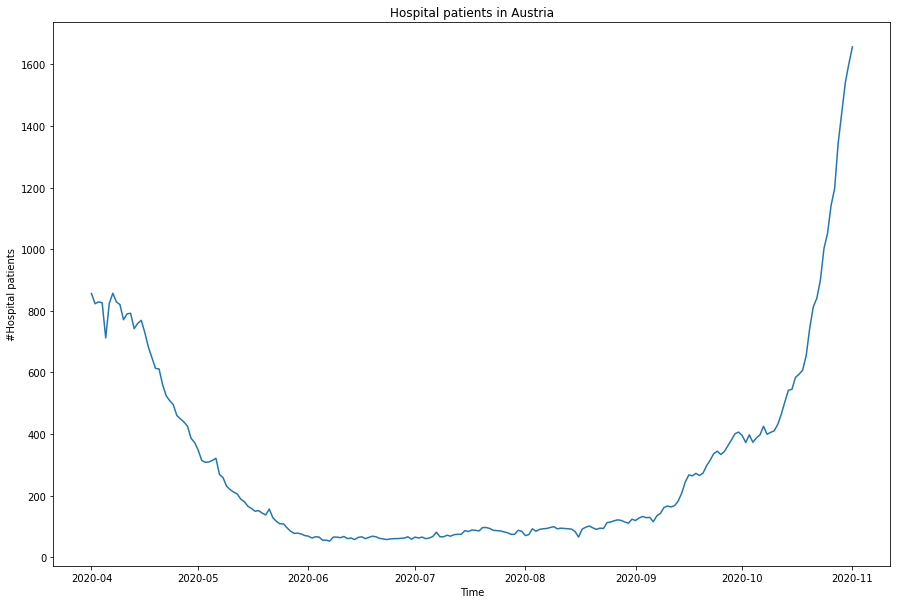

In [6]:
# creating a single line plot
plt.figure(figsize = (15,10)) 
plt.plot(data["Austria"]["date"], data["Austria"]["hosp_patients"] )
plt.xlabel('Time')
plt.ylabel("#Hospital patients")
plt.title('Hospital patients in Austria')

plt.show()

This looks like a proper line plot for me! 📈 
Note that in the last line we used `plt.show()` to show our plot. In most IPython Environments (like jupyter lab or if we open the Notebook in Visual Studio Code) we don't actually need to use `plt.show()`. Try out what happens if you comment the last line. However, if you are plotting inside a "normal" python script (suffix `.py`) and executing it from a terminal, you need to use `plt.show()`, otherwise it won't show. 


We can add multiple line plots over each other by just calling `plt.plot()` again, this time with the y-values for the `icu_patients` entries. Two make the two lines distingishuable, we can add a legend to the plot using `plt.legend()`. But before we do that we have to give each of our lines a label: This is done inside of the `plt.plot()` function. 

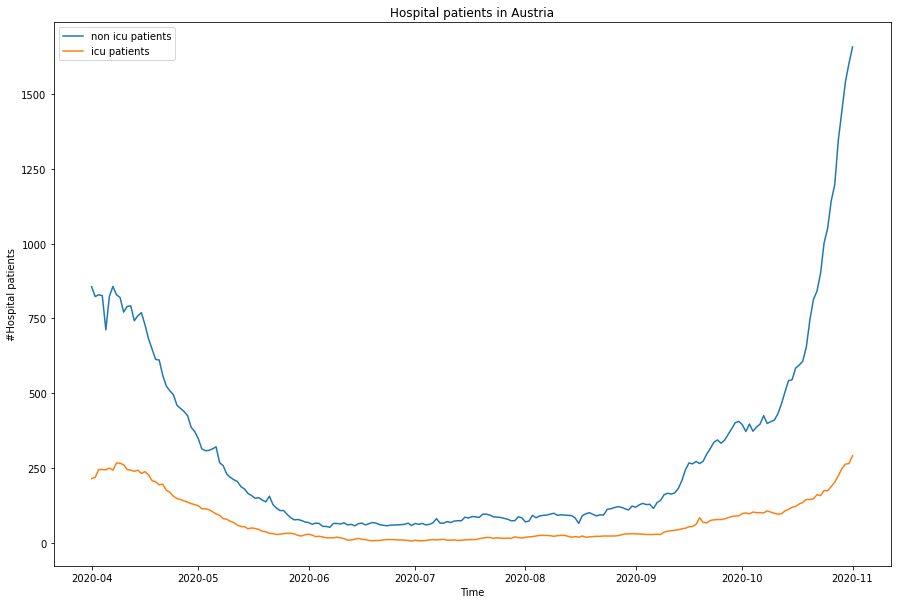

In [7]:
# creating a plot with multiple lines
plt.figure(figsize = (15,10))
plt.plot(data["Austria"]["date"], data["Austria"]["hosp_patients"], label='non icu patients')
plt.plot(data["Austria"]["date"], data["Austria"]["icu_patients"], label='icu patients')

plt.xlabel('Time')
plt.ylabel("#Hospital patients")
plt.title('Hospital patients in Austria')
plt.legend()

plt.show()

### Subplots
If we want to display two lines side-by-side rather than in the same set of x- and y-axes, subplots are a good way to do that.  
They can be designed in many different ways. A layout has rows and columns of subplots.
This is given as follows: `plt.subplot(num_rows, num_cols, index)`
So every time we call `plt.subplot` we have to define the number of rows and the number of columns for the plot. The last parameter is the index which defines the location of the subplot on the canvas. You might recognize this syntax from MATLAB. In the "fancy plotting" section we will also look at the `plt.subplots` package which is way more pythonic, so bear with us! 

The following figure has two subplots split into 1 row and 2 columns.  

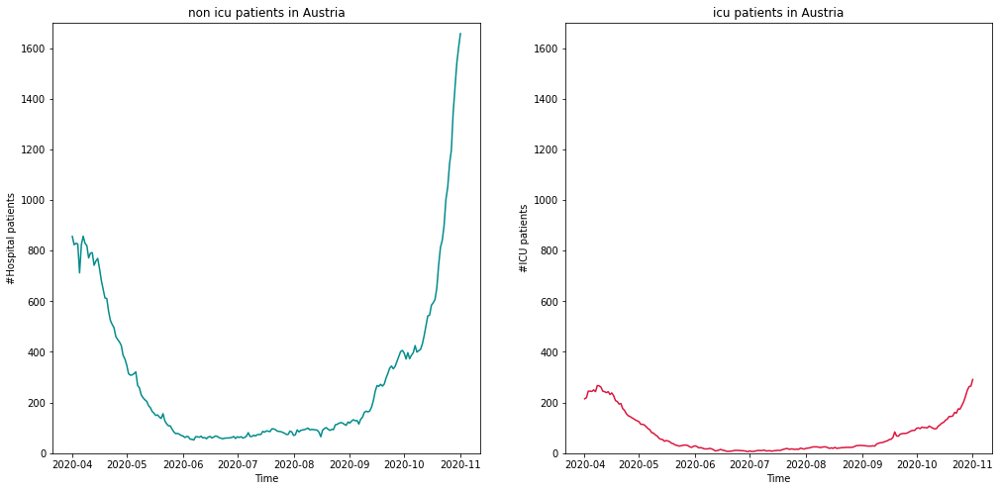

In [8]:
plt.figure(figsize = (17,8))

plt.subplot(1,2,1)
plt.plot(data["Austria"]["date"], data["Austria"]["hosp_patients"], color='DarkCyan')
plt.xlabel('Time')
plt.ylabel("#Hospital patients")
plt.ylim([0, 1700]) # if you use subplots, defining a y-limit makes them more comparable
plt.title('non icu patients in Austria')

plt.subplot(1,2,2)
plt.plot(data["Austria"]["date"], data["Austria"]["icu_patients"], color='#DC143C')
plt.xlabel('Time')
plt.ylabel("#ICU patients")
plt.ylim([0, 1700])
plt.title('icu patients in Austria')

plt.show()

### Linedesigns

To modify lines, matplotlib offers many different Linestyles.   
The `plot()` function can accept parameters to set the color(`color`), linestyle(`linestyle`), width(`linewidth`) and marker(`marker`). 

##### `color`
Color  values can be [HTML color names](https://www.w3schools.com/colors/colors_names.asp) or [HEX codes](https://www.w3schools.com/colors/colors_picker.asp) . Also, matplotlib has it's own list of named colors, which can be seen below. 

![Matplotlib Base Colors](https://matplotlib.org/stable/_images/sphx_glr_named_colors_001.png)
![Matplotlib CSS Colors](https://matplotlib.org/stable/_images/sphx_glr_named_colors_003.png)

##### `linewidth`

Linewidth sets the line width in points. By default, the `linewidth` is 1. The ´linewidth´ can be any float number smaller and bigger than 1, e.g. 7 or 0.25.


##### `linestyle`
Line styles can be dashed(`'--'`) or dotted(`':'`). You can also set `linewidth` to `"solid"`, `"dashed"` or `"dotted"`. Those linestyles are named, possible values are strings. 


|linestyle  | description |
| ------ | ------ |
| `'-'` or `'solid'` | solid line |
|`'--'` or  `'dashed'`| dashed line |
|`'-.'` or  `'dashdot'` |  dash-dotted line |
|`':'` or `'dotted'` | dotted line |
|`'none'`, `'None'`, `' '`, or `''` |  draw nothing |


Also, a [dash tuple](https://matplotlib.org/stable/gallery/lines_bars_and_markers/linestyles.html) of the following form can be provided: (offset, onoffseq)
where `onoffseq` is an even length tuple of on and off in points. 

##### `marker`
Markers can be circles(`'o'`), squares(`'s'`), stars(`'*'`) [and maaaaany mooore .. ](https://matplotlib.org/stable/api/markers_api.html). ⭐️

### Saving the figure

In matplotlib it's easy to save the figure either as an `.png` file but also as as a vectorgraphic (`.eps` which stands for **E**ncapsulated **P**ost**S**cript) which comes in handy if you want to integrate the graphic into your LaTeX project.
Use 
```
plt.savefig(<filename>, format=<format>)
```

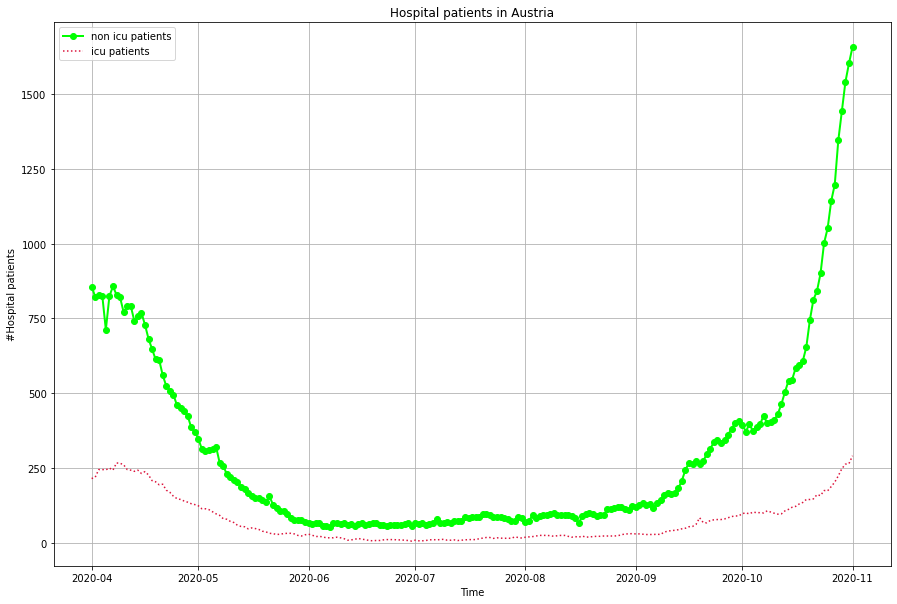

<Figure size 432x288 with 0 Axes>

In [9]:
plt.figure(figsize = (15,10))
plt.plot(data["Austria"]["date"], data["Austria"]["hosp_patients"], 
         color = 'lime', linestyle='solid', linewidth = 2, marker="o")

plt.plot(data["Austria"]["date"], data["Austria"]["icu_patients"], 
         color= '#DC143C', linestyle=':')

plt.xlabel('Time')
plt.ylabel("#Hospital patients")
plt.title('Hospital patients in Austria')
plt.legend(['non icu patients', 'icu patients'])
plt.grid()
plt.show()

#Save figures to local harddrive
plt.savefig("Hospital_patients_Austria.png", format="png")
plt.savefig("Hospital_patients_Austria.eps", format="eps")

### Plotting with pandas

Pandas has built-in plotting functions that makes use of matplotlib! 🥳🐼

In [10]:
import pandas as pd

This time, we will read the data directly from the web using pandas.

In [11]:
df = pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135153 entries, 0 to 135152
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    135153 non-null  object 
 1   continent                                   126536 non-null  object 
 2   location                                    135153 non-null  object 
 3   date                                        135153 non-null  object 
 4   total_cases                                 127687 non-null  float64
 5   new_cases                                   127685 non-null  float64
 6   new_cases_smoothed                          126642 non-null  float64
 7   total_deaths                                116482 non-null  float64
 8   new_deaths                                  116678 non-null  float64
 9   new_deaths_smoothed                         126642 non-null  float64
 

Now we will plot data directly from our DataFrame `df`:

<AxesSubplot:title={'center':'Hospital Cases in Austria over time'}, xlabel='date'>

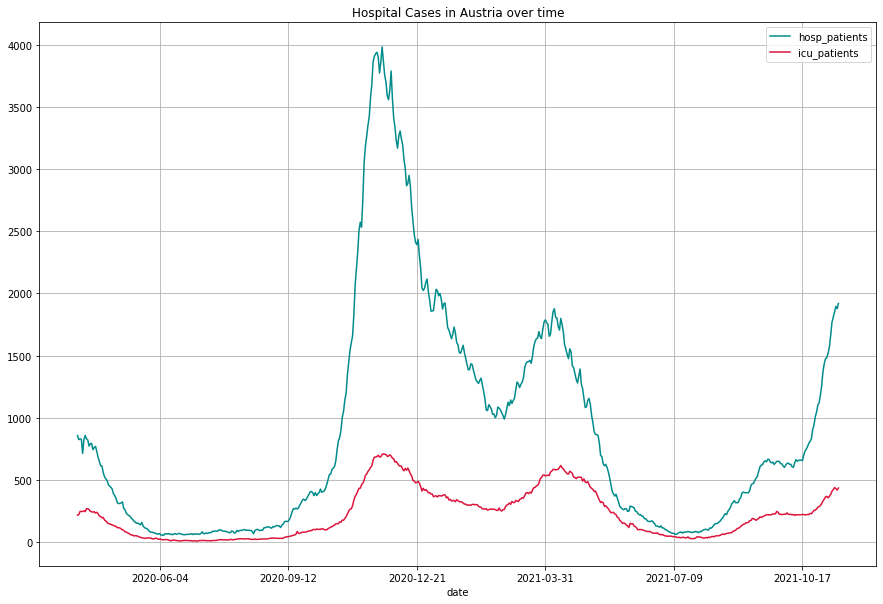

In [12]:
data_AT = df.loc[df.location == 'Austria']
data_AT.plot('date', ['hosp_patients', 'icu_patients'], color=['DarkCyan', '#DC143C'],
             figsize=(15, 10), grid=True, title="Hospital Cases in Austria over time")

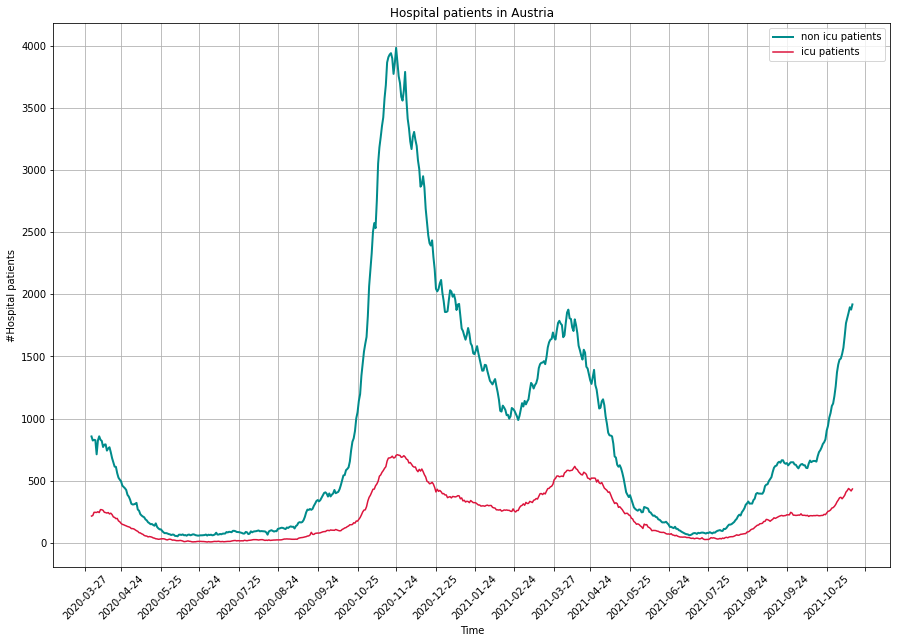

In [13]:
import matplotlib.dates as mdates # we use this to space our date-xticks

plt.figure(figsize = (15,10))

time_axis = df.loc[df.location == "Austria", "date"]
hosp_patients = df.loc[df.location == "Austria", "hosp_patients"]
icu_patients = df.loc[df.location == "Austria", "icu_patients"]

plt.plot(time_axis, hosp_patients, color = 'DarkCyan', linewidth = 2)
plt.plot(time_axis, icu_patients, color= '#DC143C')

plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xlabel('Time')
plt.xticks(rotation=45)

plt.ylabel("#Hospital patients")
plt.title('Hospital patients in Austria')
plt.legend(['non icu patients', 'icu patients'])
plt.grid()
plt.show()

### Some fancy plotting 

If you want to try many other features of matplotlib and you want to get inspired, just click here:

https://matplotlib.org/gallery/index.html 

In this example we want to look at the histogram of two-dimensional data that follows a gaussian distribution. To get the gaussian data we will import the package `numpy`.

In [14]:
import numpy as np

np.random.seed(42)

data_2 = np.random.randn(2, 1000)
print(type(data_2))

x_4 = data_2[0]
y_4 = data_2[1]

<class 'numpy.ndarray'>


Note that instead of the subplot-example above where we used the `plt.subplot` function, we now use `plt.subplots`. 
We pass the number of rows and the number of columns as positional arguments to the function and can also define the `figsize`. It then returns a figure object and a tuple containing "axis-objects" that we can access like in a matrix. Note that the syntax for axis-objects (for example for setting the x-label, title, ...) is a little different to the normal `plt` environment.

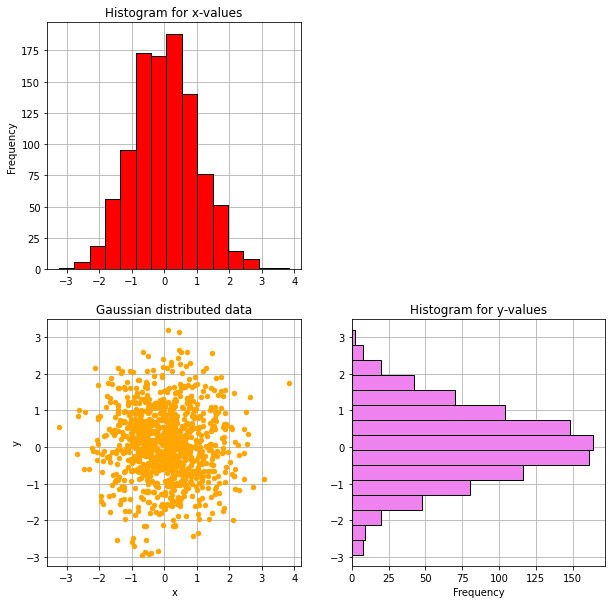

In [15]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# 2D gaussian distributed data
axes[1, 0].scatter(x_4, y_4, color="orange", s=20) # scatter plot
axes[1, 0].set_xlabel("x") 
axes[1, 0].set_ylabel("y")
axes[1, 0].set_title("Gaussian distributed data")
axes[1, 0].set_axisbelow(True) # set grid behind the data points
axes[1, 0].grid()

axes[0, 0].hist(x_4, bins=15, edgecolor="black", color='red')
axes[0, 0].set_ylabel("Frequency")
axes[0, 0].set_title("Histogram for x-values")
axes[0, 0].set_axisbelow(True) # set grid behind the data points
axes[0, 0].grid()

axes[0, 1].axis('off') # this deletes the second subplot

axes[1, 1].hist(y_4, bins=15, edgecolor="black", color='violet', orientation='horizontal')
axes[1, 1].set_xlabel("Frequency")
axes[1, 1].set_title("Histogram for y-values")
axes[1, 1].set_axisbelow(True) # set grid behind the data points
axes[1, 1].grid()

plt.show()

## Plotly
Plotly is a python library for easy plot creation. Below are the links to the documentation of plotly
* https://plotly.com/python-api-reference/
* https://plotly.com/python/plotly-express/
* https://plotly.com/python/creating-and-updating-figures/#figures-as-graph-objects

You may need to install the Jupyterlab extensions. Type the following in your console:  

`pip install plotly` (for Mac & Linux use `pip3 install plotly`)  
`jupyter labextension install jupyterlab-plotly` (You may have to install [Node.js](https://nodejs.org/en/))

`jupyter labextension install @jupyter-widgets/jupyterlab-manager plotlywidget`  

In [16]:
# read data for plotting from unit_7_data.p file (available from TC)
import pickle 

with open("unit_7_data.p", "rb") as p:
    data = pickle.load(p)

#### Plotly `graph_objects`

There are two major ways you can create a plot in plotly. Via `graph_objects` ([docs](https://plotly.com/python/creating-and-updating-figures/#figures-as-graph-objects)) or via `plotly.express` ([docs](https://plotly.com/python/plotly-express/)). Both have their usecases. First we introduce plotting via `graph_objects`.     

You can import it with:  
```python
import plotly.graph_objects as go
```  

Below we create a simple line plot with the covid dataset from the assignment. For this, you first have to create a figure (`go.Figure()`) and then a scatterplott (`go.Scatter()`) with the data. This is useful if you have your data in a dictionary.

The process in `graph_objects` is to first create a figure object with the data and then update the layout of that figure using `fig.update_layout()`. There you can pass keyword arguments to modify the title for the figure or the axes for example.

In [17]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Scatter(x=data["Austria"]["date"], y=data["Austria"]["hosp_patients"]))

#This adds title and y/x-labeling
fig.update_layout(title='Hospital patients in Austria',
                   xaxis_title='Date',
                   yaxis_title='#Hospital patients')
fig.update_layout(xaxis={"rangeslider": {"visible": True}})
fig.show()

Now this is a fancy plotting library and it didn't take that many lines of code! 🤓
Note that plotly offers an interactive plot: You can hover with the mouse over the line to reveal the date and also define the range for the date using the slider below the plot.

#### Multiple lines in one plot

You can also plot more lines in one plot. For that you can use: 
```python 
fig.add_trace()
```
You can also use the `line` keyword argument in `go.Scatter` to modify the properties of the line. Like the color, width or the line appearance. Further you can use the `name` keyword argument to set a label for the line in the legend.

In [18]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data["Austria"]["date"], 
                         y=data["Austria"]["hosp_patients"],
                         name="non-icu patients",
                         line = dict(color='royalblue', width=2, dash='dot'))) # 'solid', 'dot', 'dash', 'longdash', 'dashdot', 'longdashdot'

fig.add_trace(go.Scatter(x=data["Austria"]["date"], 
                         y=data["Austria"]["icu_patients"],
                         name="icu patients" ))

fig.update_layout(title='Hospital patients in Austria',
                  xaxis_title='Date',
                  yaxis_title='#Hospital patients')

#fig.update_yaxes(type="log")

fig.update_layout(xaxis={"rangeslider": {"visible": True}})
fig.show()

#### Subplots
You can also create subplots in Plotly. This is done by creating the figure with:
```python
make_subplots(rows=<amount_rows>, cols=<amount_cols>)
```
For this you first have to import the function `make_subplots` with:
```python
from plotly.subplots import make_subplots
```
Now you can choose in the `add_trace` method at which position the subplot should be created with the `col` and `row` parameter.

In [19]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Scatter(x=data["Austria"]["date"], 
                         y=data["Austria"]["hosp_patients"],
                         name="non-icu patients"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=data["Austria"]["date"], 
                         y=data["Austria"]["icu_patients"],
                         name="icu patients", showlegend=False),
              row=2, col=1)


fig.update_layout(title='Hospital patients in Austria',
                  yaxis_title='#Non-ICU patients',
                  xaxis2_title='Date',
                  yaxis2_title='#ICU patients')

#### Plotly `plotly.express`
Next we show you the same plots with `plotly.express`.   

You can import it with:  
```python
import plotly.express as px
```  
Plotly express is especcialy useful if you want to plot dataframes (e.g. Pandas Dataframe).  

In [20]:
import plotly.express as px
import pandas as pd

### Import the Covid csv from the assignment
dataframe = pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv")

# Only use data from Austria
data_austria = dataframe.loc[dataframe.location == "Austria"]

#### Line plot
You can plot a line with:
```python
px.line()
```
Below we use all the data from Austria and with the argument `x` we can choose which column of the dataframe should be used as the x-axes and with `y` we can choose which column should be used in the y-axes. With `title` you can set a title for the plot.

In [21]:
fig = px.line(data_austria, x="date",y="hosp_patients", title="Hospital Patients in Austria")
#fig.update_xaxes(title_text = "Date")
#fig.update_yaxes(title_text = "# Hospital patients")
#fig.update_layout(xaxis={"rangeslider": {"visible": True}})
fig.show()

Now this is efficient plotting! This monstrosity of a line plot just took ONE line to generate. And we can still hover over it to reveal the exact values at a specific date. It even formats the date to show only the Months.

#### Multiple lines in one plot

You can also plot more lines in one plot. This is done by giving the `y` parameter in `px.line` a list of column names which should be used for the y axis.

In [22]:
fig = px.line(data_austria, x="date", y=["hosp_patients", "icu_patients"], title="Hospital Patients in Austria",)
fig.update_xaxes(title_text = "Date")
fig.update_yaxes(title_text = "# Hospital patients")
fig.update_layout(xaxis={"rangeslider": {"visible": True}})
fig.show()

#### Subplots
You can also create subplots in Plotly Express. This can be done by the `facet_row` argument where you can enter along which column the data should be split into subplots. In the example below we use location so three subplots will be created since only 3 different entries ("Austria", "United States", "Italy") are in the dataframe.

In [23]:
data_filtered = dataframe.loc[dataframe.location.isin(["Austria", "United States", "Italy"])]
fig = px.line(data_filtered, x="date", y=["hosp_patients", "icu_patients"], facet_row="location", title="Hospital Patients")
fig.update_yaxes(title_text = "#Hospital patients")
fig.update_layout(xaxis={"rangeslider": {"visible": True}})
fig.show()

You can also set the color argument. This creates a new line with a different color for every entry in the dataframe with this key (in the example below "location") .


In [24]:
fig = px.line(dataframe, x="date", y="hosp_patients", color="location", title="Hospital Patients")
fig.update_yaxes(title_text = "#Hospital patients")
fig.update_layout(xaxis={"rangeslider": {"visible": True}})
fig.show()

#### Exporting a static figure
Dynamic plots are hard to realize in a static document like a `.pdf` file. Therefore, you need to export plotly as a static image which depends on another library called `kaleido`. Fortunately, `kaleido` can be installed using pip:
```
pip install kaleido
```
We can then export the image using
```
fig.write_image(<filename>)
```
Supported formats are
- png
- jpeg
- WebP
- svg, pdf, eps

Let's export our simple line plot we created using plotly express:

In [25]:
fig = px.line(data_austria, x="date",y="hosp_patients", title="Hospital Patients in Austria")

# fig.write_image("hosp_patients_austria_plotly.png")

#### Why Plotly?? 

With plotly its very easy to create complex plots with only a few lines of code.

Try it out!!

In [26]:
dataframe_countries = dataframe.loc[(dataframe.date >= "2021-01-01") & ~dataframe.location.isin(["World", "International"])]

dataframe_countries_no_na = dataframe_countries[dataframe_countries[["population", "continent"]].notnull().all(axis=1)]

In [27]:
# it may take a while to run this cell, but be patient, it's worth it! 
fig = px.scatter(dataframe_countries_no_na, 
                 x="new_tests", 
                 y="new_cases", 
                 animation_frame="date", 
                 animation_group="location",
                 size="population", 
                 color="continent",
                 hover_name="location", 
                 facet_col="continent",
                 log_x=True, 
                 log_y=True, 
                 range_x=[1,5000000], 
                 range_y=[1,500000]
                )
fig.show()

In [28]:
from datetime import date
import numpy as np
#Helper function to filter data
def get_data_country_newest(data, col_name, date=str(date.today()), use_newest=False):
    countries = list(np.unique(data['location']))
    countries.remove("International")
    world_data = data.loc[(data.location == "World") & (data.date == date)][col_name].values[0]
    countries.remove("World")
    
    if use_newest:
        data_unique = data.drop_duplicates(subset=["location"], keep="last") 
        countries = data_unique[data_unique.location.isin(countries)].location.values
        countries_data = data_unique[data_unique.location.isin(countries)][col_name].values
    else:       
        countries_data = data[data.location.isin(countries) & (data.date == date)][col_name].values
        countries = data[data.location.isin(countries) & (data.date == date)].location.values
          
    return countries, countries_data, world_data

#Helper function to filter data
def get_text_data(data, countries):
    data_unique = data.drop_duplicates(subset=["location"], keep="last") 
    data_unique = data_unique[data_unique.location != "International"]
    data_unique = data_unique[data_unique.location != "World"]
    
    population = data_unique[data_unique.location.isin(countries)].population.values
    human_development_index = data_unique[data_unique.location.isin(countries)].human_development_index.values
    hospital_beds_per_thousand = data_unique[data_unique.location.isin(countries)].hospital_beds_per_thousand.values
    gdp_per_capita = data_unique[data_unique.location.isin(countries)].gdp_per_capita.values
    stringency_index = data_unique[data_unique.location.isin(countries)].stringency_index.values
    
    text = []
    for country_index, _ in enumerate(countries):
        text.append(f"population: {population[country_index]}<br>\
human development index: {human_development_index[country_index]:.3f}<br>\
hospital beds per thousand: {hospital_beds_per_thousand[country_index]:.3f}<br>\
gdp per capita: {gdp_per_capita[country_index]:.3f}<br>\
stringency index: {stringency_index[country_index]}")
        
    return text
    
 
# Plot Function
def plot_world(countries, countrie_data, title, marker_title,  map_mode='orthographic', text=None):
    if text is None:
        text = countries
        
    fig = go.Figure(data=go.Choropleth(
        locations = countries,
        z = countrie_data,
        locationmode = 'country names',
        text = text,
        colorscale=[[0, "rgb(0, 117, 49)"], [0.1, "rgb(255, 251, 0)"], [1, "rgb(184, 0, 0)"]],
        #colorscale = 'RdYlGn',
        reversescale=False,
        marker = dict(
            line = dict(color = 'rgb(150, 148, 143)', width = 0.5)),
            colorbar = dict(tickprefix = '', 
            title = marker_title)
            )
    )

    fig.update_layout(
        title_text=title,
        width= 700,
        height= 700,
        geo=dict(
            showframe=False,
            showcoastlines=False,
            projection_type=map_mode,
            showocean=True,
            oceancolor = 'rgb(160, 242, 238)',
        ),
    )

    fig.show()

In [29]:
data = pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv")

In [30]:
date_ = str("2021-11-20")
countries, new_cases, world_new_cases = get_data_country_newest(data, "new_cases", date=date_)
text = get_text_data(data, countries)
plot_world(countries, new_cases, f'COVID-19 Cases in countries form {".".join(date_.split("-")[::-1])}.<br>World wide cases: {world_new_cases:.0f}', "Total Cases", map_mode='orthographic', text=text)

In [31]:
countries, total_cases, world_cases = get_data_country_newest(data, "total_cases", date="2020-11-11", use_newest=True)
text = get_text_data(data, countries)
plot_world(countries, total_cases, f'Total COVID-19 Cases in countries.<br>World wide cases: {world_cases:.0f}', "Total Cases per Million", map_mode='orthographic', text=text)